In [6]:
# mount drive if needed
from google.colab import drive
drive.mount('/gdrive')
# CD to your working directory to upload images

Mounted at /gdrive


# Download the required files

In [7]:
import os
import urllib.request

# Define directory and filename
save_dir = "/content/images"
filename = "roi_kala.tif"

# Create the directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# Add all images here
# Define the image URL
image_url = "https://raw.githubusercontent.com/MohanadDiab/langrs/main/data/roi_kala.tif"

# Download the image
image_path = os.path.join(save_dir, filename)
urllib.request.urlretrieve(image_url, image_path)

print(f"Image downloaded to: {image_path}")


Image downloaded to: /content/images/roi_kala.tif


# Usage
In this notebook, we provide an example of how to use the langrs package using an image and a text input.


*   The image input is provided as a tif file, and the text input is the object to be segmented in the provided aerial image.

*   Grounding Dino is used first to provide bounding boxes for the object specified in the text input

* Outlier rejection is then applied to the resulting bounding boxes to filter out the non-homogenous sized bounding boxes.

* Segment Anything Model (SAM) is then used to produce the segmentation masks, utilizing the boudnding boxes resulting from the previous steps.

* Finally, visualization is provided to both our segmentation output and the segmentation output of the SamGeo output. A qualitative anlysis shows that the techniques deployed in our approach achieves better results in a setting where objects of homogenous sizes are to be segmented.





Install the package using pip

In [8]:
!pip install langrs --quiet

Import LangRS class from the langrs package

In [9]:
from langrs.core import LangRS

**Initialize an instance of the class, 3 main inputs are required when an instance is to be initiated:**

1. image: String that indicates the path to the input Tiff file.
2. prompt: A string representing the object of interest that needs to be segmented in the aerial image.
3. output_path: An output folder path, a folder with a timestamp will be created in this folder which will hold all the plots.

In [10]:
prompt = 'roof'
output_path = 'output'
seg_params = {"box_threshold": 0.25, "text_threshold": 0.25}

In [11]:
model = LangRS(image=image_path, prompt=prompt, output_path=output_path)

GroundingDINO_SwinB.cfg.py:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:26<00:00, 98.1MB/s]


In [12]:
input_image = model.pil_image

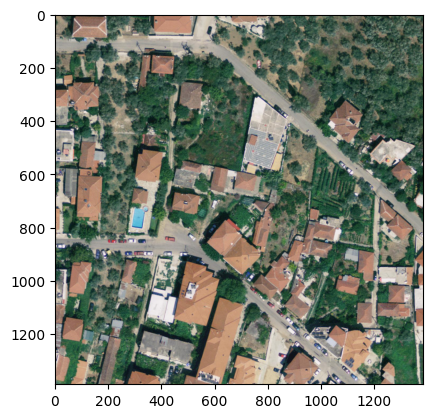

In [13]:
import matplotlib.pyplot as plt
plt.imshow(input_image)
# add title with unit of pixels
# mention the spatial resolution
# Acqusition area size
plt.show()

In [14]:
# Talk about accuracy, insert table in the paper
# Talk anout window size recommendations
bounding_boxes = model.predict_dino(window_size=600, overlap=300, **seg_params)

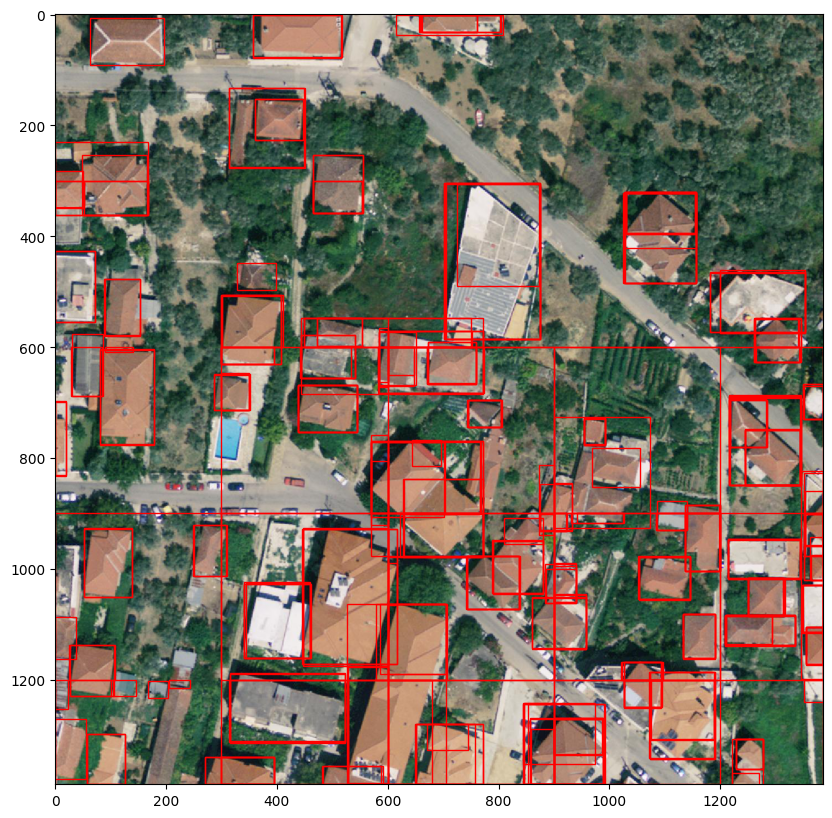

In [15]:
from matplotlib.patches import Rectangle

# Plot boudning boxes as rectangles
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(input_image)

for box in bounding_boxes:
  x_min, y_min, x_max, y_max = box
  width = x_max - x_min
  height = y_max - y_min
  rect = Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')
  ax.add_patch(rect)

plt.show()

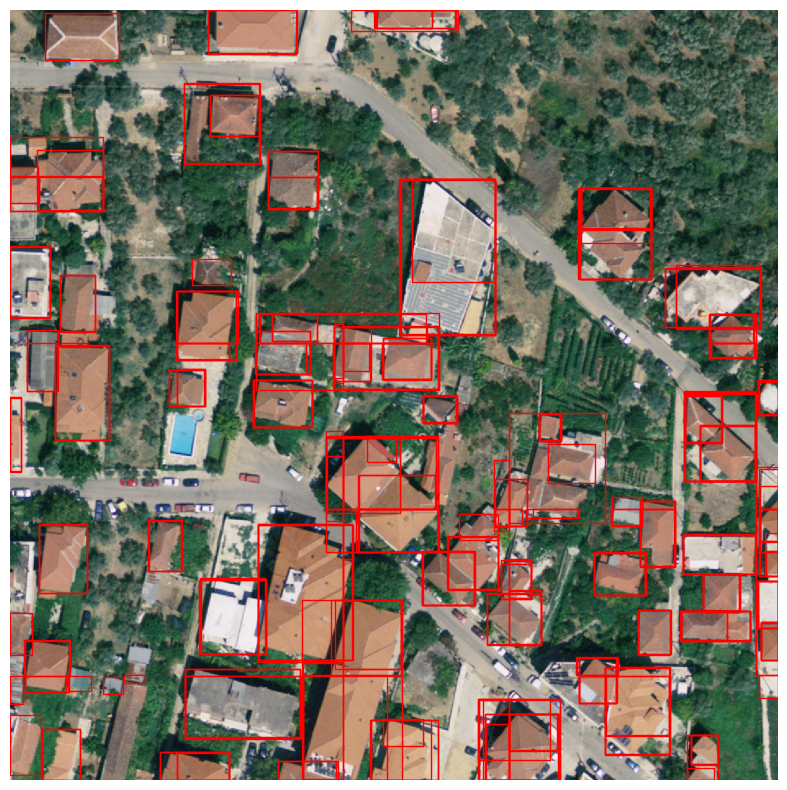

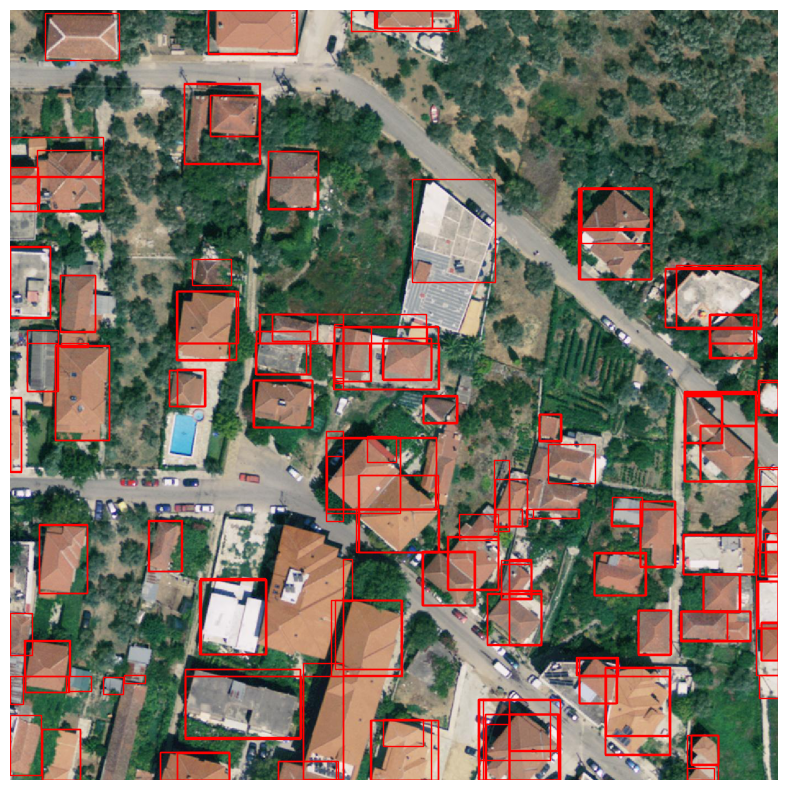

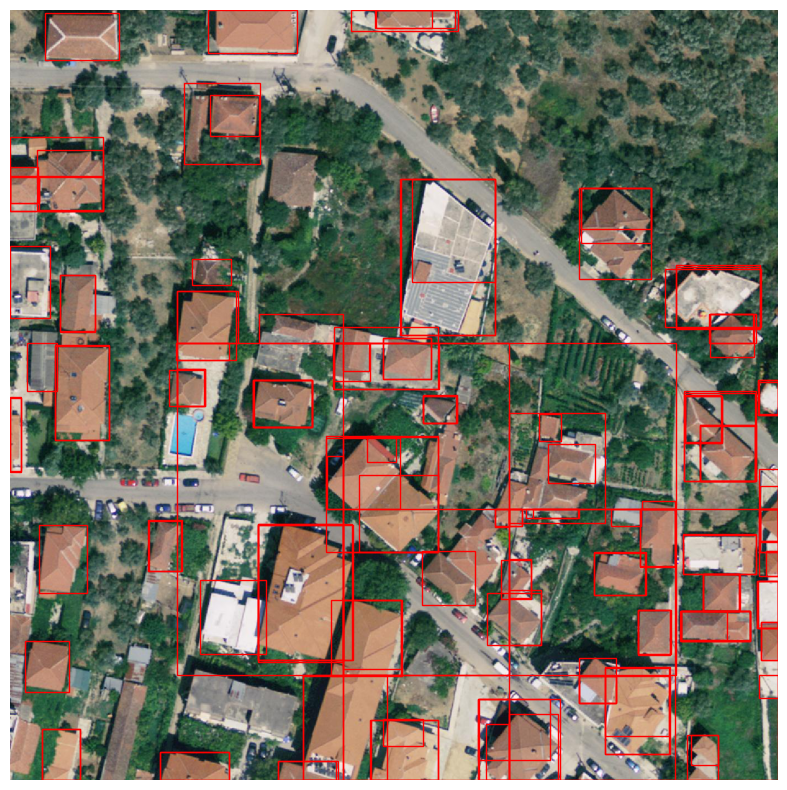

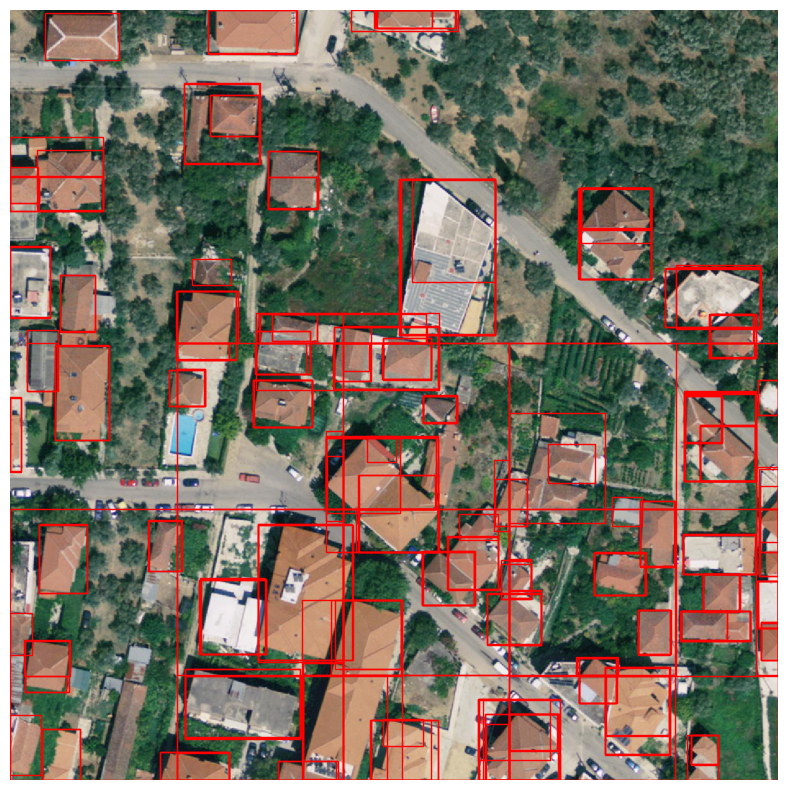

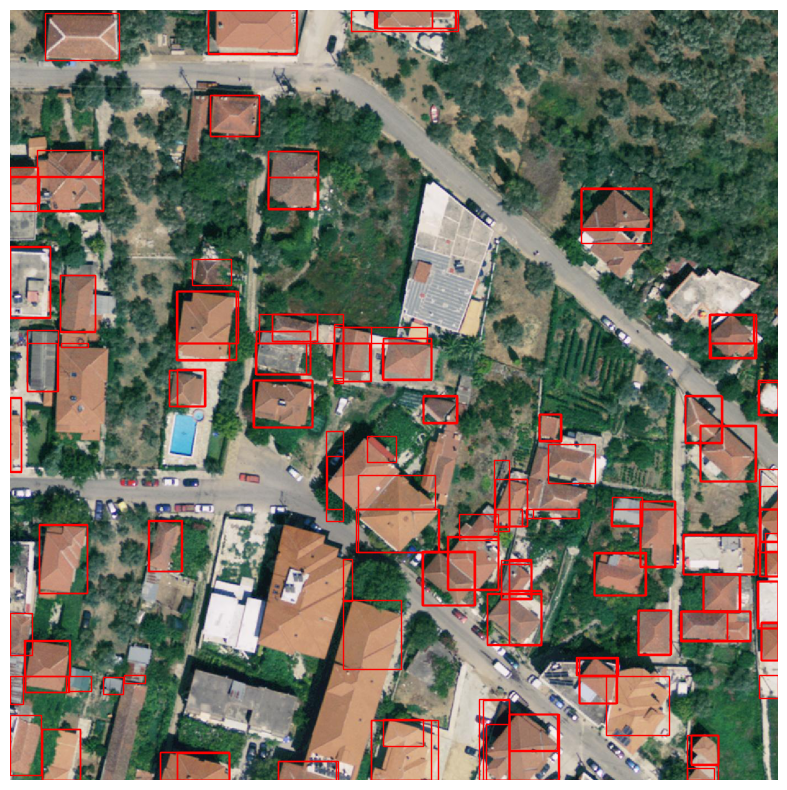

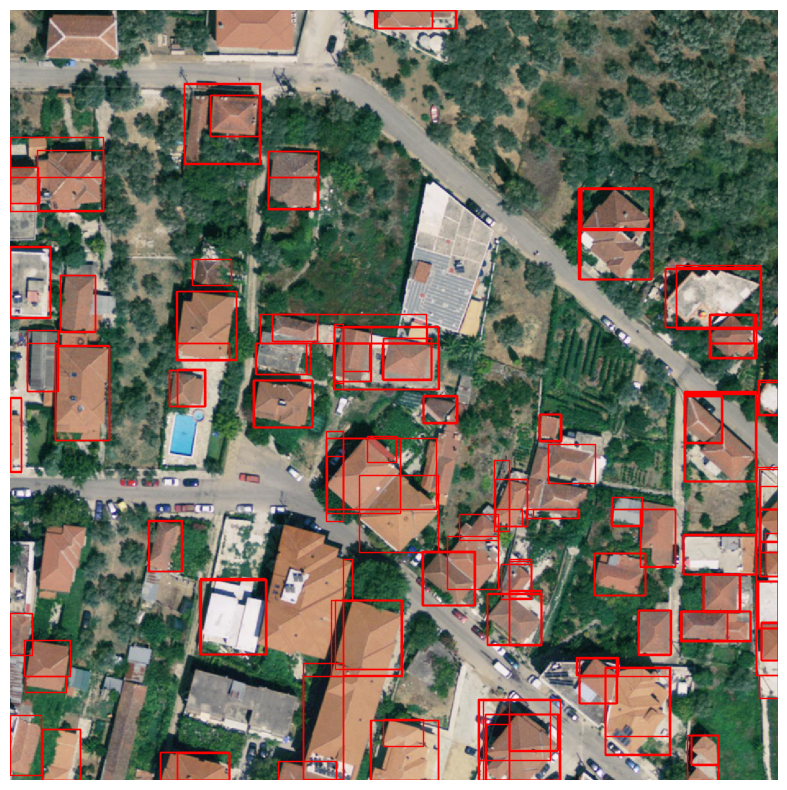

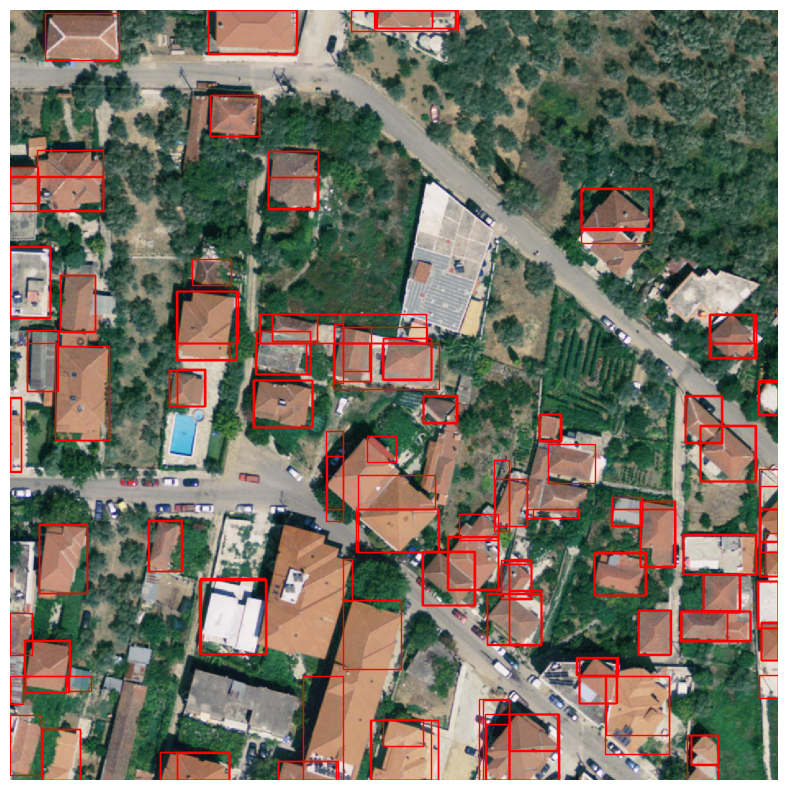

In [16]:
# Add titles of rejection methods to plots
# Mention the different rejection methods
# plot in sublot!
bboxes_filtered = model.outlier_rejection()

In [ ]:
bboxes_filtered.keys()

dict_keys(['zscore', 'iqr', 'svm', 'svm_sgd', 'robust_covariance', 'lof', 'isolation_forest'])

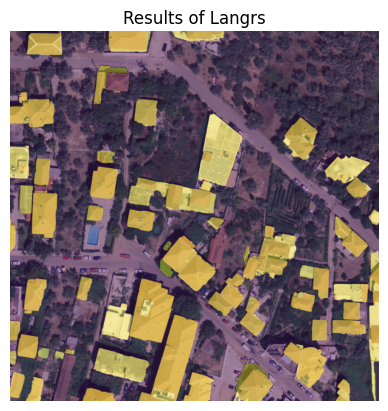

In [17]:
masks = model.predict_sam(rejection_method="zscore")

fig, ax = plt.subplots()
ax.imshow(input_image)
ax.imshow(masks, cmap="viridis", alpha=0.4)
ax.axis('off')  # Turn off the axes

# Save the figure with tight bounding box to remove whitespace
plt.title("Results of Langrs")
plt.show()

In [18]:
from samgeo.text_sam import LangSAM
samgeo = LangSAM()

final text_encoder_type: bert-base-uncased


In [19]:
samgeo.predict(image_path, prompt, **seg_params)

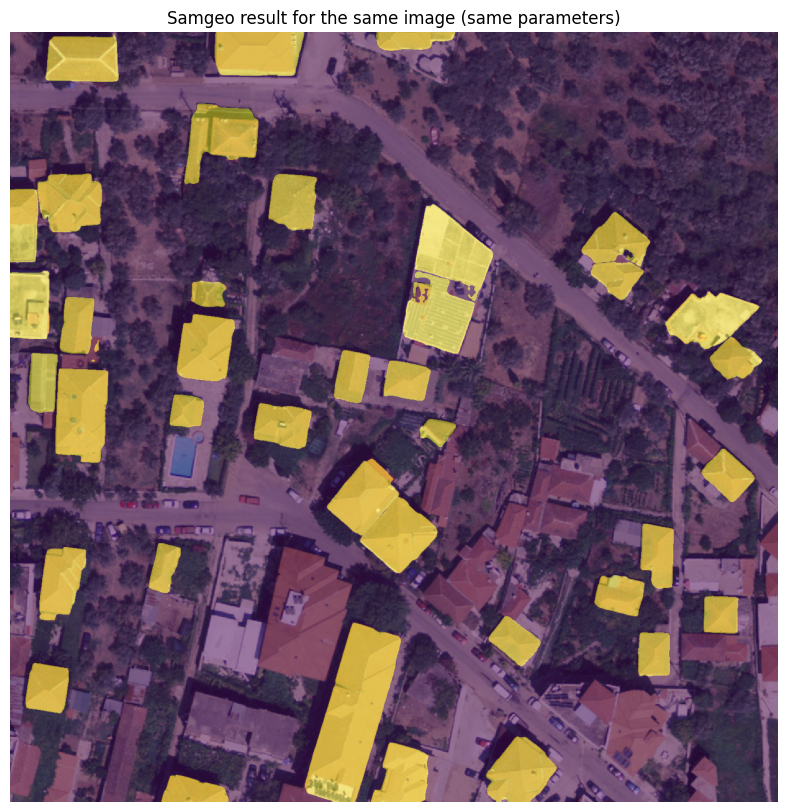

In [26]:
samgeo.show_anns(
    cmap="viridis",
    add_boxes=False,
    alpha=0.5,
    title="Samgeo result for the same image (same parameters)",
)

Trying Samgeo with different input parameters

In [21]:
samgeo.predict(image_path, prompt, text_threshold = 0.3, box_threshold=0.3)

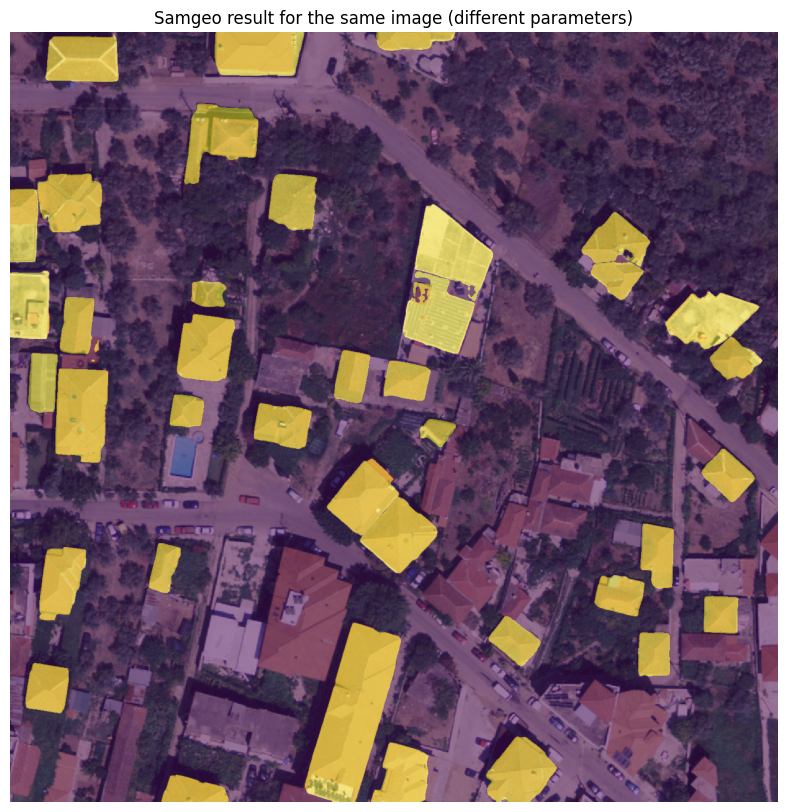

In [27]:
samgeo.show_anns(
    cmap="viridis",
    add_boxes=False,
    alpha=0.5,
    title="Samgeo result for the same image (different parameters)",
)

In [23]:
samgeo.predict(image_path, prompt, text_threshold = 0.27, box_threshold=0.27)

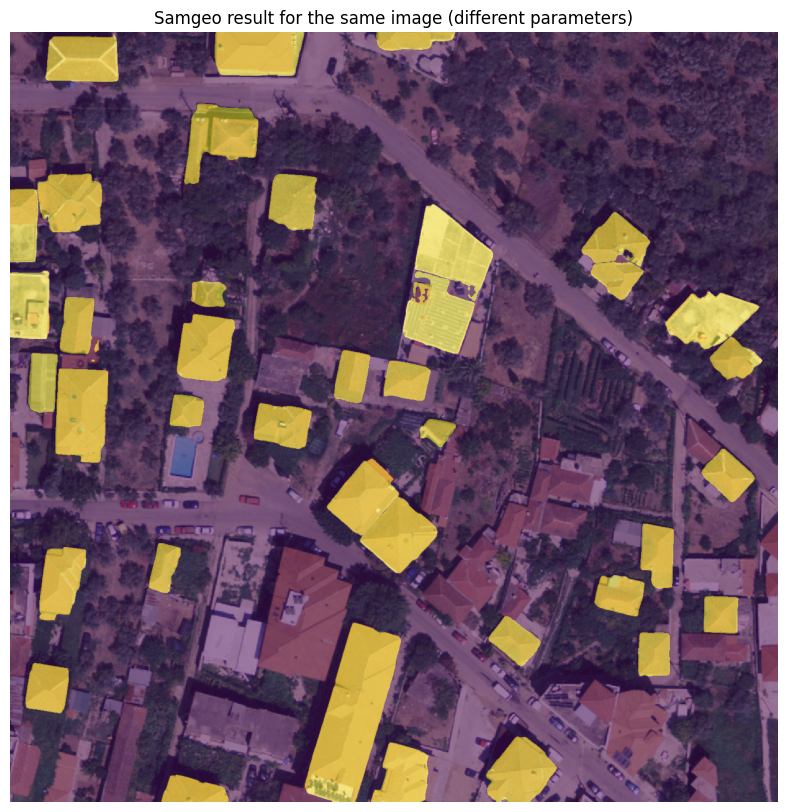

In [28]:
samgeo.show_anns(
    cmap="viridis",
    add_boxes=False,
    alpha=0.5,
    title="Samgeo result for the same image (different parameters)",
)

In [ ]:
# Add some comments on why LangRS works
# Add the case of cars or trees
# Allow some time for people to experiment
# Mention the benefits of zero-shot detection using foundation models
# The interface is something to be introduced later hopefully
# Add some words to the ppt.